# Jarvis march algorithm

In [7]:
#def jarvismarch(inputSet):
def jarvismarch(inputSet):
    #p is the set of points
    points = inputSet
    #Find an origin point outside the set,P_0.
    startpoint = min(inputSet) 
    origin = startpoint
    outputSet = []
    endpoint = None
    while endpoint is not startpoint: #The endpoint goes back to the startpoint and the algorithm is completed.
        p1 = None
        for p in points: #traverse all points,give p1 arbitrary value except origin.
            if p is origin: 
                continue
            else:
                p1 = p
                break
        endpoint = p1
        for p2 in points: #traverse all points , except p_0 and p_1.
            if p2 is origin or p2 is p1:
                continue
            else:
                direction =((endpoint[0]-origin[0])*(p2[1]-origin[1]))-((p2[0]-origin[0])*(endpoint[1]-origin[1])) #find points
                                                                                                                   #anticlockwise
                if direction > 0:
                     endpoint = p2  #update endpoint
        outputSet.append(endpoint)
        origin = endpoint
    return outputSet

Use the cell below for all python code needed to generate test data points (both random and those representing worst-case scenario).

In [8]:
import random
#code for random data generation
def random_data(N):
    inputlista = [[random.randint(0, 32767) for j in range(1, 3)] for i in range(N)] #get N pairs random points
    return inputlista 
    
#code for worst case data generation O(n*H) n==h
import math 
def worst_case_data(N):#The worst case is that all of the input points lie on the convex hull,eg,circle or ellipse.
    inputlistb = []
    a,b=16383,16383 #take midpoint of the interval as center of the circle
    r = 16383  #half of the interval as radius
    for i in range(N):  
        theta=random.uniform(0,2*math.pi)
        x = a + r * math.cos(theta)  #points on the circle
        y = b + r * math.sin(theta)
        inputlistb.append([x,y])
    return inputlistb


Use the cell below for all python code needed to test the `jarvismarch()` function on the data generated above.

In [9]:
import timeit
#test code
# random data time
timelista = []
# for N in [100,500, 1000, 5000, 10000, 15000,20000]:
for N in [100,500,1000,5000,10000,15000,20000]:
    inputlista=random_data(N)
    t = timeit.timeit("jarvismarch(inputSet=inputlista)","from __main__ import jarvismarch,inputlista ",number=100)
    timelista.append(t/100)


#worst case data time
timelistb =[]
# for N in [100,500, 1000, 5000, 10000, 15000,20000]:
for N in [100,500,1000,5000,10000,15000,20000]:
    inputlistb=worst_case_data(N)
    t = timeit.timeit("jarvismarch(inputSet=inputlistb)","from __main__ import jarvismarch,inputlistb ",number=100)
    timelistb.append(t/100)


In [10]:
print(timelista)
print(timelistb)

[0.00023310000000265063, 0.0015359000000216838, 0.002717399999994541, 0.016685499999994136, 0.03691140000000814, 0.06482389999996485, 0.08312940000001845]
[0.0014275000000338878, 0.03550000000001319, 0.1422268000000031, 3.527503299999978, 14.06939090000003, 31.6263639, 56.88426049999998]


*Optional*: Feel free to use the code below on small datasets (e.g., N = 10) to visually inspect whether the algorithm has been implemented correctly. The fragment below assumes both `inputSet` and `outputSet` to be lists of 2D points, with each point being a list of 2 elements (e.g., `[[x1,y1], [x2,y2], ..., [x_k,y_k]]`)

8
18
17
25
23
25
26


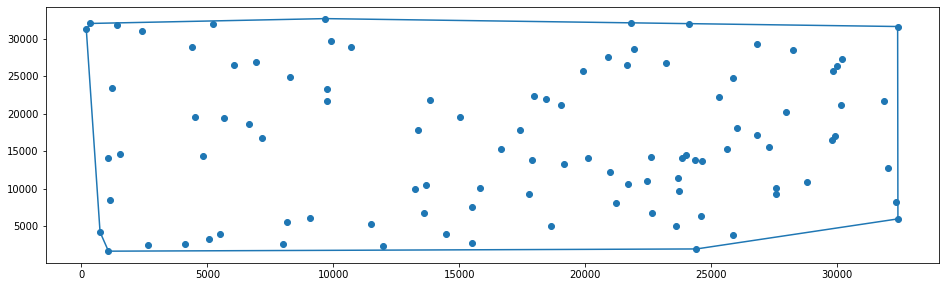

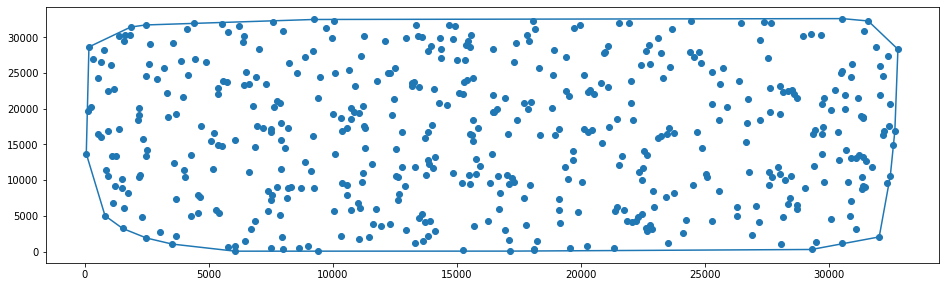

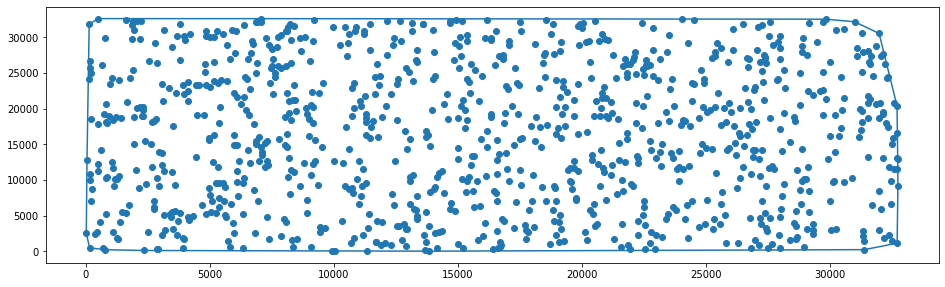

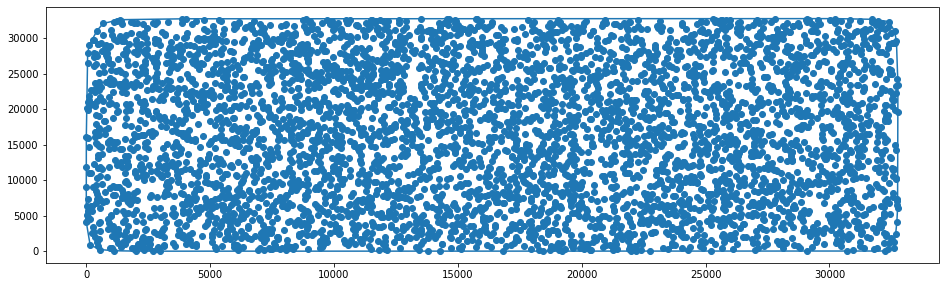

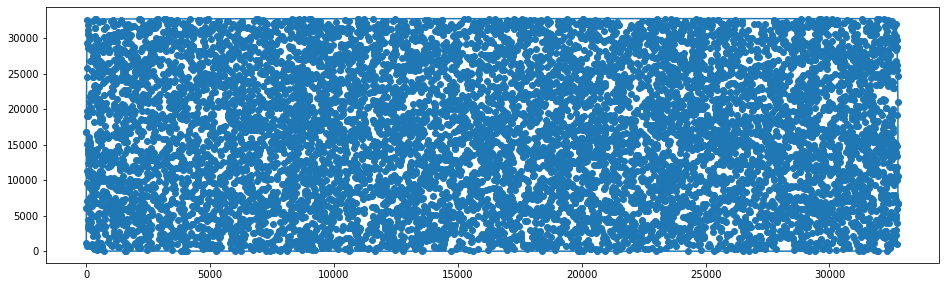

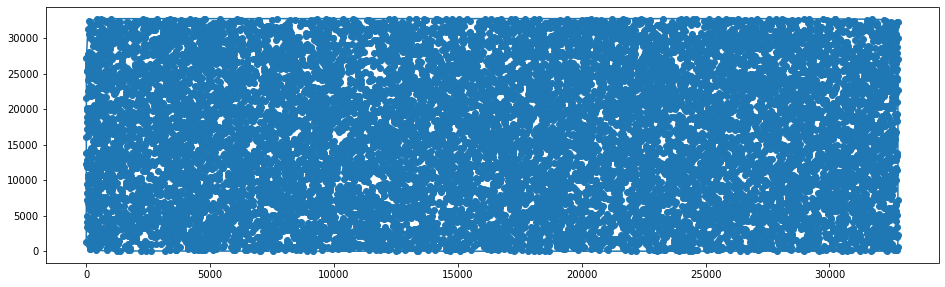

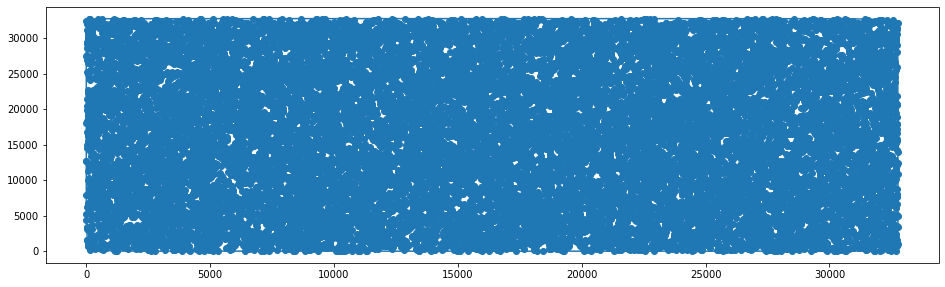

In [11]:
import matplotlib.pyplot as plt

# inputSet and outputSet should have been defined above. 
# uncomment the next two lines only if you wish to test the plotting code before coding your algorithm
#inputSet = [[1,1], [2,2] , [3, 3], [4,4], [1,4], [3,1], [1, 5], [2, 4], [3, 5]]
#outputSet = [[1,1], [3,1] , [4, 4], [3,5], [1,5]]

for N in [100,500, 1000,5000,10000,15000,20000]:
    inputSet = random_data(N)
    outputSet = jarvismarch(inputSet)
    i=1
    plt.figure(figsize=(16,16))
    plt.subplot(3,1,i)
    print(len(outputSet))
    #first do a scatter plot of the inputSet
    input_xs, input_ys = zip(*inputSet)
    plt.scatter(input_xs, input_ys)
    #then do a polygon plot of the computed covex hull
    outputSet.append(outputSet[0]) #first create a 'closed loop' by adding the first point at the end of the list
    output_xs, output_ys = zip(*outputSet) 
    plt.plot(output_xs, output_ys) 
plt.show() 




100
500
1000
5000
10000
15000
20000


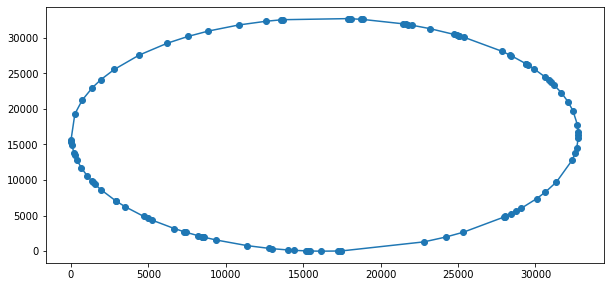

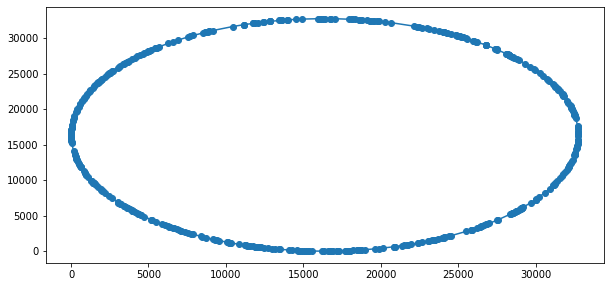

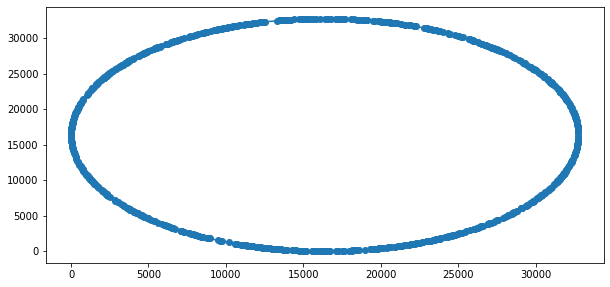

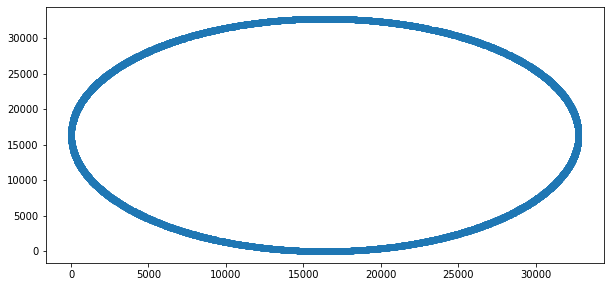

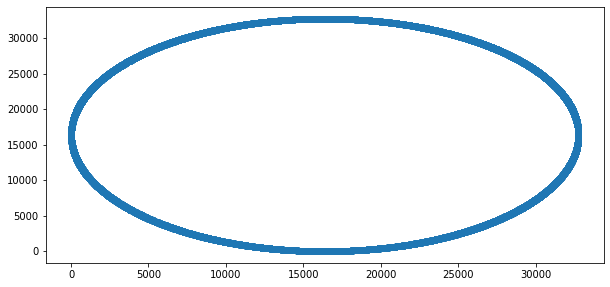

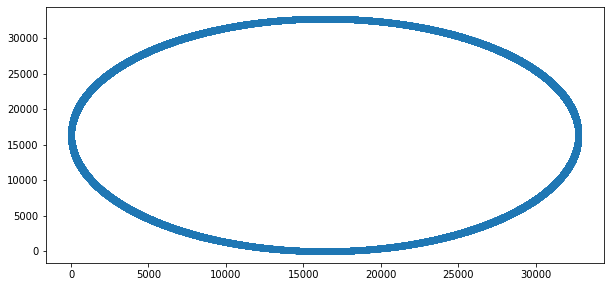

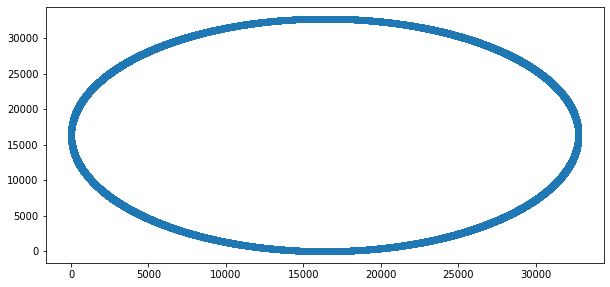

In [12]:
for N in [100,500, 1000,5000,10000,15000,20000]:
    inputSet = worst_case_data(N)
    outputSet = jarvismarch(inputSet)
    i=1
    plt.figure(figsize=(10,16))
    plt.subplot(3,1,i)
    print(len(outputSet))
    #first do a scatter plot of the inputSet
    input_xs, input_ys = zip(*inputSet)
    plt.scatter(input_xs, input_ys)
    #then do a polygon plot of the computed covex hull
    outputSet.append(outputSet[0]) #first create a 'closed loop' by adding the first point at the end of the list
    output_xs, output_ys = zip(*outputSet) 
    plt.plot(output_xs, output_ys) 
plt.show() 


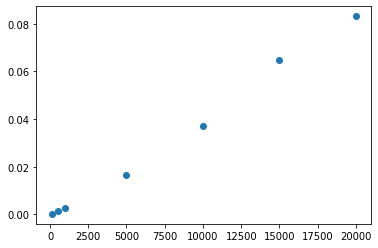

In [13]:
import matplotlib.pyplot as plt
x = [100,500,1000,5000,10000,15000,20000]
plt.figure()
plt.scatter(x,timelista)
plt.show()

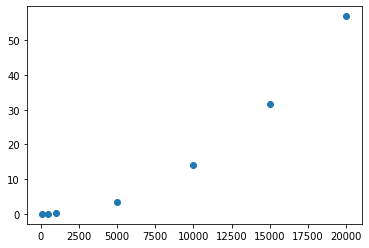

In [14]:
import matplotlib.pyplot as plt
x = [100,500,1000,5000,10000,15000,20000]
plt.figure()
plt.scatter(x,timelistb)
plt.show()